In [114]:
# import spatialdata as sd
import scanpy as sc
import scanpy.external as sce
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from pathlib import Path
from anndata import AnnData
import anndata as ad
import scvi
from scib_metrics.benchmark import Benchmarker

In [133]:
import warnings
warnings.filterwarnings('ignore')

# Practical Day 3: Day 3: Integrative analysis of droplet-based single-cell and spatial data

## Part 2: Horizontal data integration

### Helper functions

In [6]:
cell_type_color = {
    'B_Cells': '#565DFD',
    'CD4+_T_Cells': '#4fa9ff',
    'CD8+_T_Cells': '#1068be',
    'DCIS_1': '#fb34cd',
    'DCIS_2': '#FE664D',
    'Endothelial': '#01257b',
    'IRF7+_DCs': '#9f50f9',
    'Invasive_Tumor': '#ff002a',
    'LAMP3+_DCs': '#AB76AE',
    'Macrophages_1': '#10686f',
    'Macrophages_2': '#3694a8',
    'Mast_Cells': '#999999',
    'Myoepi_ACTA2+': '#009203',
    'Myoepi_KRT15+': '#66c102',
    'Perivascular-Like': '#515151',
    'Prolif_Invasive_Tumor': '#8e0119',
    'Stromal': '#e5e022',
    'Stromal_&_T_Cell_Hybrid': '#C1A029',
    'T_Cell_&_Tumor_Hybrid': '#CB6035',
    'Unlabeled': '#ffa5aa'
}


def umap(adata: AnnData, basis: str, neighbors_kwargs: dict = {}, umap_kwargs: dict = {}):
    """
    Helper function to performs UMAP dimensionality reduction on an AnnData object.

    Parameters
    ----------
    adata : AnnData
        The AnnData object containing the data to be processed.
    basis : str
        The basis to use for the UMAP calculation.
    neighbors_kwargs : dict, optional
        Additional keyword arguments to be passed to `sc.pp.neighbors` function.
        Default is an empty dictionary.
    umap_kwargs : dict, optional
        Additional keyword arguments to be passed to `sc.tl.umap` function.
        Default is an empty dictionary.

    Returns
    -------
    None

    Notes
    -----
    This function performs UMAP dimensionality reduction on the input `adata` object
    using the specified `basis`. If the `basis` a PCA is computed. It then first computes 
    the neighbors graph using the `sc.pp.neighbors` function, with the option to provide 
    additional keyword arguments via `neighbors_kwargs`. Then, it applies the UMAP algorithm 
    using the `sc.tl.umap` function, with the option to provide additional keyword arguments 
    via `umap_kwargs`. Finally, it stores the UMAP coordinates in the `obsm` attribute of the 
    `adata` object under the key `"{basis}_umap"`, and removes the original `"X_umap"` 
    coordinates.

    Example
    -------
    >>> adata = AnnData(X)
    >>> umap(adata, basis="pca", neighbors_kwargs={"n_neighbors": 10}, umap_kwargs={"min_dist": 0.5})

    """
    if (basis not in adata.obsm) and (f'X_{basis}' not in adata.obsm):
        sc.pp.pca(adata, n_comps=20)
        adata.uns[basis] = adata.uns['pca']
        adata.obsm[f'X_{basis}'] = adata.obsm['X_pca']
        adata.varm[f'PCs_{basis}'] = adata.varm['PCs']
        
        del adata.obsm['X_pca']
        del adata.uns['pca']
        del adata.varm['PCs']
        
    
    if f'X_{basis}' in adata.obsm:
        basis = f'X_{basis}'
        
    sc.pp.neighbors(adata, use_rep=f"{basis}", key_added=f"{basis}", **neighbors_kwargs)
    sc.tl.umap(adata, neighbors_key=f"{basis}", **umap_kwargs)
    adata.obsm[f"{basis}_umap"] = adata.obsm["X_umap"]
    del adata.obsm["X_umap"]

### Load data

The following cells load the Xenium an and scFFPE-seq data.

In [7]:
xenium = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/xenium_rep1.h5ad')

In [8]:
scffpe = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/scFFPE_raw.h5ad')

### Optional: Downsample the Xenium dataset

To make things a bit faster ...

In [9]:
xenium = xenium[xenium.obs.sample(scffpe.shape[0]).index]

### EDA - Exploratory data analysis

#### Xenium data

We first inspect the two datasets independently, starting with the Xenium dataset.

In [10]:
xenium

View of AnnData object with n_obs × n_vars = 27460 × 313
    obs: 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'Cluster', 'replicate'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'Cluster_colors'
    obsm: 'spatial'

The `anndata` contains the spatial coordinates of each cell in its `obsm` field. To visualise the data, we employ the `sc.pl.embedding` function and pass the arguments `spatial` and `Cluster` to inspect the structure of the tissue. 

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


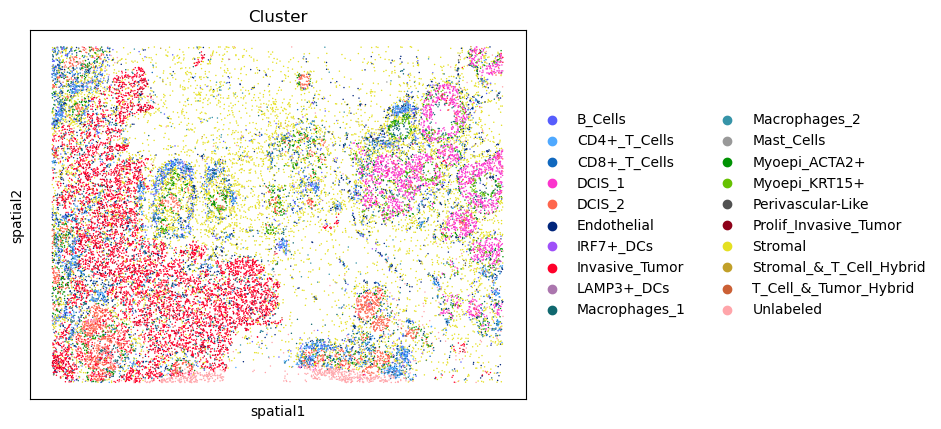

In [11]:
sc.pl.embedding(xenium, 'spatial', color='Cluster')

Next, we continue with some basic preprocessing of the data. 

In [12]:
sc.pp.calculate_qc_metrics(xenium, percent_top=(10, 20, 50, 150), inplace=True)

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/preprocessing/_qc.py:135: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs[obs_metrics.columns] = obs_metrics


Next we plot the distribution of total transcripts per cell, unique transcripts per cell, area of segmented cells and the ratio of nuclei area to their cells (adapted from the Squidpy tutorial).



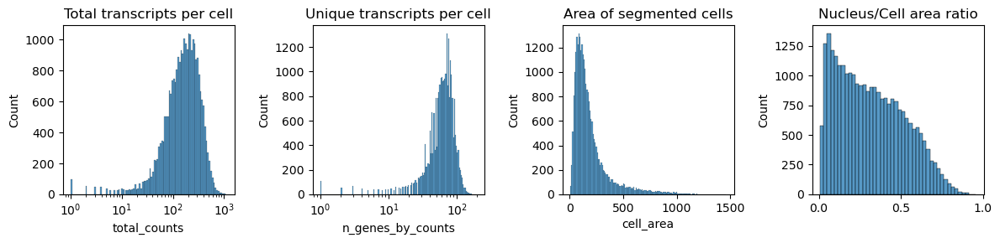

In [13]:
fig, axs = plt.subplots(1, 4, figsize=(12, 3))

axs[0].set_title("Total transcripts per cell")
sns.histplot(
    xenium.obs["total_counts"],
    log_scale=True,
    kde=False,
    ax=axs[0],
)

axs[1].set_title("Unique transcripts per cell")
sns.histplot(
    xenium.obs["n_genes_by_counts"],
    log_scale=True,
    kde=False,
    ax=axs[1],
)

axs[2].set_title("Area of segmented cells")
sns.histplot(
    xenium.obs["cell_area"],
    ax=axs[2],
)

axs[3].set_title("Nucleus/Cell area ratio")
sns.histplot(
    xenium.obs["nucleus_area"] / xenium.obs["cell_area"],
    ax=axs[3],
)
plt.tight_layout()

We filter the cells based on the minimum number of counts required using `sc.pp.filter_cells`. Filter the genes based on the minimum number of cells required with `sc.pp.filter_genes`. The parameters for the both were specified based on the plots above. They were set to filter out the cells and genes with minimum counts and minimum cells respectively.

In [14]:
sc.pp.filter_cells(xenium, min_counts=10)
sc.pp.filter_genes(xenium, min_cells=5)

We then proceed with the standard protocol for preprocessing the single-cell RNA counts. We save the original count data in the `layer` field of the `anndata` object and proceed with normalising the logCP10K transformation.

In [15]:
xenium.layers["counts"] = xenium.X.copy()
sc.pp.normalize_total(xenium, inplace=True, target_sum=1e4)
sc.pp.log1p(xenium)

Next, we produce a UMAP (based on PCA embeddings) to obtain an overview of the data.

In [16]:
umap(xenium, basis='pca_xenium')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


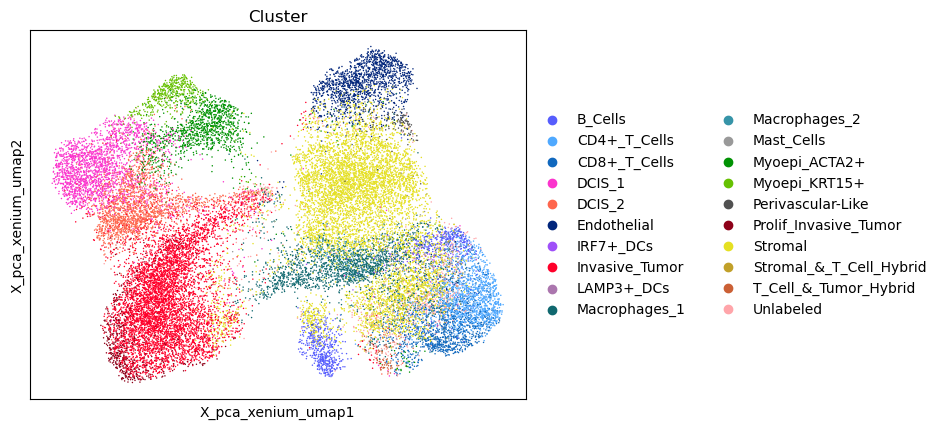

In [17]:
sc.pl.embedding(xenium, basis='X_pca_xenium_umap', color='Cluster')

#### scFFPE-seq

We perform some quality control for the scFFPE-seq. For now, we will filter out cells that do not pass QC.


In [18]:
scffpe.var['mt'] = scffpe.var_names.str.startswith('MT-')

In [19]:
# scffpe.obs['n_genes'] = (scffpe.X > 0).sum(1)

In [20]:
sc.pp.calculate_qc_metrics(scffpe, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [21]:
scffpe

AnnData object with n_obs × n_vars = 27460 × 18082
    obs: 'Cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Cluster_colors'

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:840: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


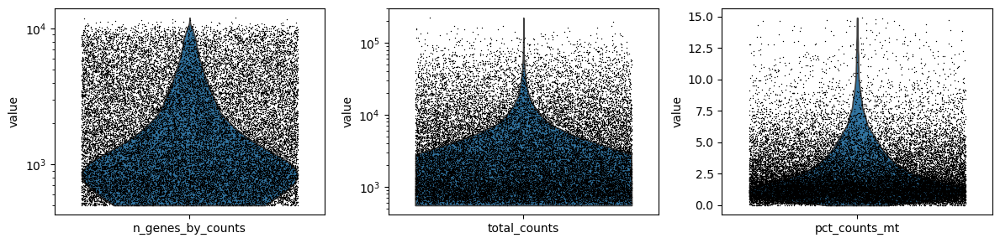

In [22]:
fig, ax = plt.subplots(1, 3, figsize=(12, 3))
sc.pl.violin(scffpe, 'n_genes_by_counts',  jitter=0.4, ax=ax[0], show=False)
ax[0].set_yscale('log')
sc.pl.violin(scffpe, 'total_counts',  jitter=0.4, ax=ax[1], show=False)
ax[1].set_yscale('log')
sc.pl.violin(scffpe, 'pct_counts_mt',  jitter=0.4, ax=ax[2], show=False)
plt.tight_layout()

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_utils.py:715: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  color = color[sort]


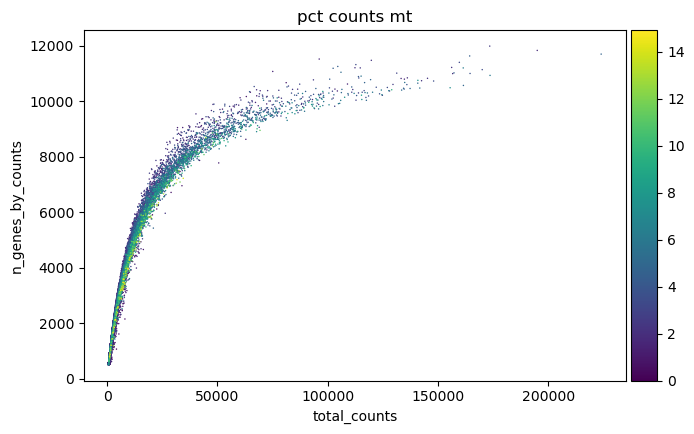

In [23]:
#Data quality summary plots
p1 = sc.pl.scatter(scffpe, 'total_counts', 'n_genes_by_counts', color='pct_counts_mt')

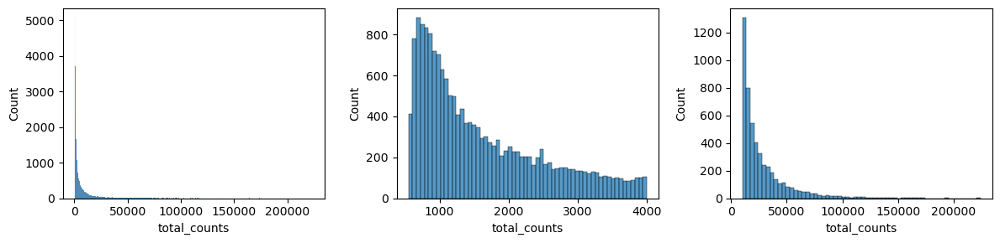

In [24]:
fig, ax = plt.subplots(1, 3, figsize=(12, 3))

sns.histplot(scffpe.obs['total_counts'], kde=False, ax=ax[0])
sns.histplot(scffpe.obs['total_counts'][scffpe.obs['total_counts']<4000], kde=False, bins=60, ax=ax[1])
sns.histplot(scffpe.obs['total_counts'][scffpe.obs['total_counts']>10000], kde=False, bins=60, ax=ax[2])
plt.tight_layout()

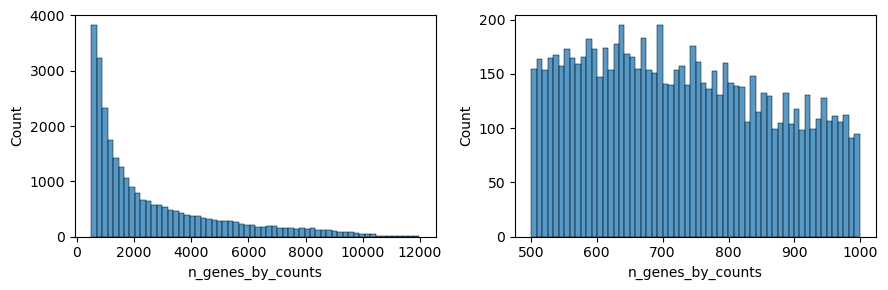

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(9, 3))
#Thresholding decision: genes
sns.histplot(scffpe.obs['n_genes_by_counts'], kde=False, bins=60, ax=ax[0])
sns.histplot(scffpe.obs['n_genes_by_counts'][scffpe.obs['n_genes_by_counts']<1000], kde=False, bins=60, ax=ax[1])
plt.tight_layout()

We filter some of the cells with very large counts.

In [26]:
sc.pp.filter_cells(scffpe, max_counts = 1e5)

And finish the preprocessing by lognormalizing the counts.

In [27]:
scffpe.layers["counts"] = scffpe.X.copy()
sc.pp.normalize_total(scffpe, inplace=True, target_sum=1e4)
sc.pp.log1p(scffpe)

In [28]:
umap(scffpe, basis='pca_scffpe')

In [29]:
scffpe

AnnData object with n_obs × n_vars = 27371 × 18082
    obs: 'Cluster', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Cluster_colors', 'log1p', 'pca_scffpe', 'X_pca_scffpe', 'umap'
    obsm: 'X_pca_scffpe', 'X_pca_scffpe_umap'
    varm: 'PCs_pca_scffpe'
    layers: 'counts'
    obsp: 'X_pca_scffpe_distances', 'X_pca_scffpe_connectivities'

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


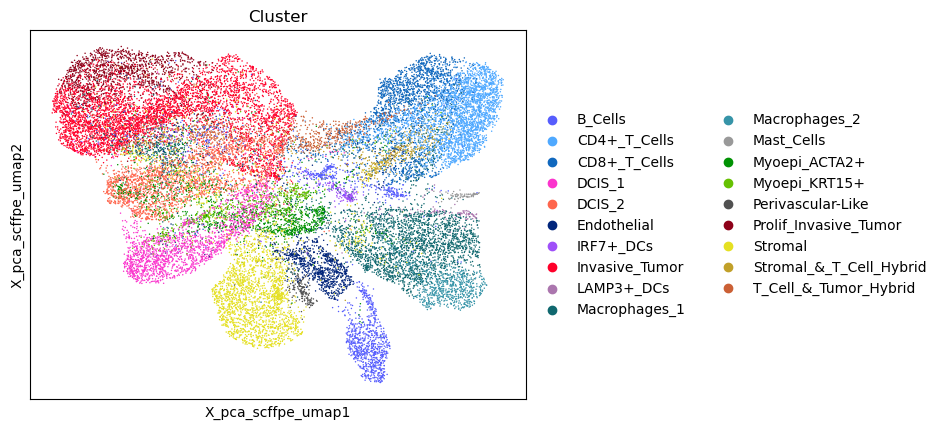

In [30]:
sc.pl.embedding(scffpe, basis='X_pca_scffpe_umap', color='Cluster')

### Concatenate the data

We add the batch variable `Tech` to both `anndata` objects and concatenate both objects.

In [139]:
xenium_concat = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/xenium_rep1.h5ad')
scffpe_concat = sc.read_h5ad('/home/voehring/voehring/projects/2024-01-23_visium/scFFPE_raw.h5ad')

In [32]:
xenium_concat.obs['Tech'] = 'xenium'

In [33]:
scffpe_concat.obs['Tech'] = 'scffpe'

In [34]:
xenium_concat = xenium_concat[xenium.obs.index]

In [35]:
scffpe_concat = scffpe_concat[scffpe.obs.index]

In [36]:
adata = ad.concat([xenium_concat, scffpe_concat])

In [37]:
adata

AnnData object with n_obs × n_vars = 54193 × 307
    obs: 'Cluster', 'Tech'

In [38]:
adata.layers['counts'] = adata.X

In [39]:
adata.uns['Cluster_colors'] = [ cell_type_color[x] for x in  adata.obs['Cluster'].cat.categories ] 

### Preprocess data

Naive application of dimensionality reduction (PCA) and compute a UMAP results in the following.

In [40]:
sc.pp.normalize_total(adata, inplace=True, target_sum=1e4)
sc.pp.log1p(adata)

In [41]:
umap(adata, 'uncorrected')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

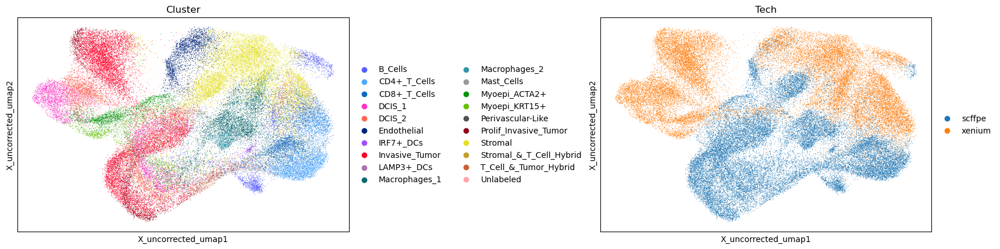

In [42]:
sc.pl.embedding(adata, basis='X_uncorrected_umap', color=['Cluster', 'Tech'], wspace=.6)

### Batch integration methods

#### Combat

In [71]:
adata.layers['combat'] = sc.pp.combat(adata, key='Tech', inplace=False)

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:199: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  batch_info = model.groupby(key).indices.values()
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:95: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  batch_items = model.groupby(batch_key).groups.items()
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/preprocessing/_combat.py:340: RuntimeWarning: divide by zero encountered in divide
  (abs(g_new - g_old) / g_old).max(), (abs(d_new - 

In [78]:
adata.obsm['X_combat'] = sc.pp.pca(adata.layers['combat'], n_comps=20)

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


In [79]:
umap(adata, basis='X_combat')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

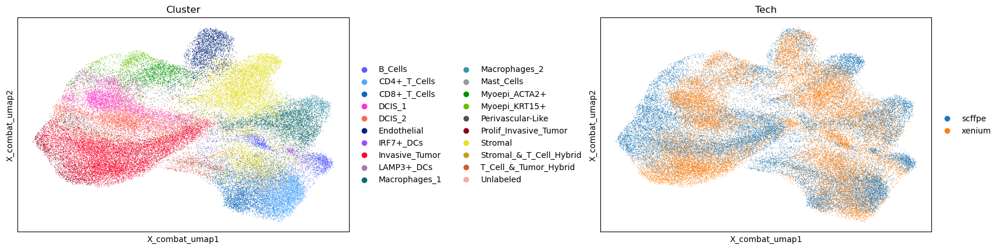

In [80]:
sc.pl.embedding(adata, basis='X_combat_umap', color=['Cluster', 'Tech'], wspace=.6)

#### Harmony

In the following we apply harmony.

In [43]:
sce.pp.harmony_integrate(adata, basis='X_uncorrected', key='Tech')

2024-01-25 17:33:43,475 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-01-25 17:34:01,386 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-01-25 17:34:01,841 - harmonypy - INFO - Iteration 1 of 10
2024-01-25 17:34:28,190 - harmonypy - INFO - Iteration 2 of 10
2024-01-25 17:34:54,043 - harmonypy - INFO - Iteration 3 of 10
2024-01-25 17:35:20,283 - harmonypy - INFO - Iteration 4 of 10
2024-01-25 17:35:46,355 - harmonypy - INFO - Iteration 5 of 10
2024-01-25 17:36:11,825 - harmonypy - INFO - Iteration 6 of 10
2024-01-25 17:36:37,274 - harmonypy - INFO - Iteration 7 of 10
2024-01-25 17:36:50,856 - harmonypy - INFO - Converged after 7 iterations


In [44]:
umap(adata, basis='X_pca_harmony')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

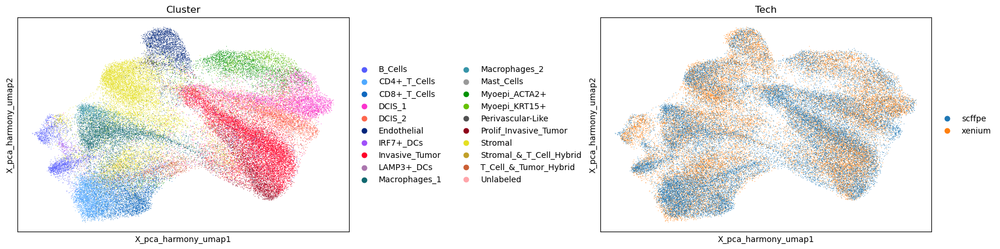

In [45]:
sc.pl.embedding(adata, basis='X_pca_harmony_umap', color=['Cluster', 'Tech'], wspace=.6)

In [50]:
adata.layers['counts'][:,4].sum()

49121.945

#### Scanorama

In [60]:
idx = adata.obs.sort_values("Tech").index
adata = adata[idx]

In [63]:
sce.pp.scanorama_integrate(adata, key='Tech', basis='X_uncorrected')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/external/pp/_scanorama_integrate.py:105: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  batch_name = adata.obs[key][idx]


[[0.       0.615542]
 [0.       0.      ]]
Processing datasets scffpe <=> xenium


In [67]:
umap(adata, basis='X_scanorama')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

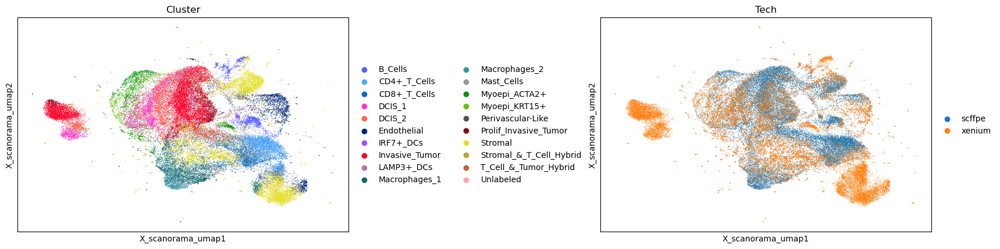

In [69]:
sc.pl.embedding(adata, basis='X_scanorama_umap', color=['Cluster', 'Tech'], wspace=.6)

#### BKNN

In [83]:
sce.pp.bbknn(adata, batch_key='Tech', use_rep='X_uncorrected')

In [88]:
adata.obsp['X_bknn_distances'] = adata.obsp['distances']
adata.obsp['X_bknn_connectivities'] = adata.obsp['connectivities']

In [92]:
adata.uns['X_bknn'] = adata.uns['neighbors']

In [93]:
sc.tl.umap(adata, neighbors_key='X_bknn')

In [96]:
adata.obsm['X_bknn_umap'] = adata.obsm['X_umap']

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

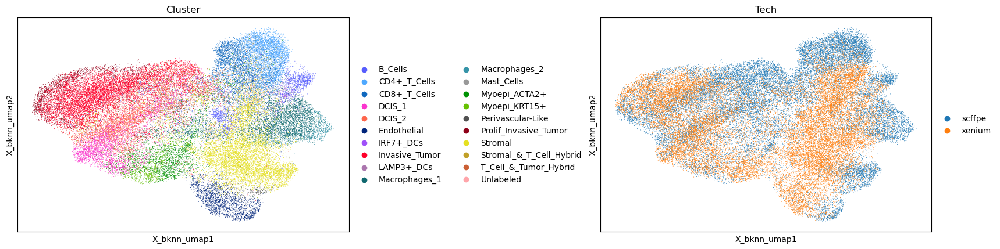

In [97]:
sc.pl.embedding(adata, basis='X_bknn_umap', color=['Cluster', 'Tech'], wspace=.6)

#### SCVI

In [99]:
scvi.model.SCVI.setup_anndata(adata, layer="counts", batch_key="Tech")

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [100]:
model = scvi.model.SCVI(adata, n_layers=2, n_latent=20, gene_likelihood="nb")

In [101]:
model.train()

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.10 /home/voehring/conda/spatialdata_stable/lib/pyth ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.10 /home/voehring/conda/spatialdata_stable/lib/pyth ...
  rank_zero_warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 148/148: 100%|███████████████████████████████████████████████████████████████████████████████████| 148/148 [19:11<00:00,  7.79s/it, v_num=1, train_loss_step=488, train_loss_epoch=221]

`Trainer.fit` stopped: `max_epochs=148` reached.


Epoch 148/148: 100%|███████████████████████████████████████████████████████████████████████████████████| 148/148 [19:11<00:00,  7.78s/it, v_num=1, train_loss_step=488, train_loss_epoch=221]


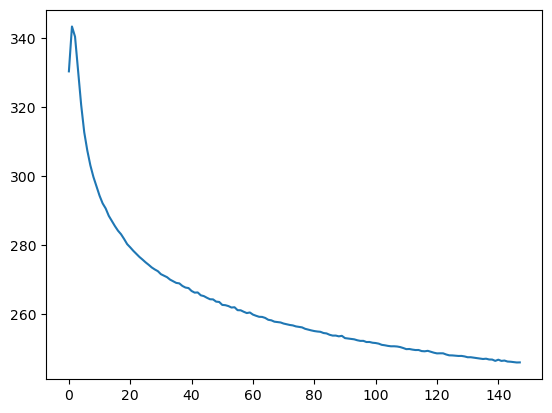

In [110]:
plt.plot(model.history["elbo_train"])
# plt.plot(model.history["elbo_"])

In [111]:
SCVI_LATENT_KEY = "X_scVI"
adata.obsm[SCVI_LATENT_KEY] = model.get_latent_representation()

In [112]:
umap(adata, basis='X_scVI')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

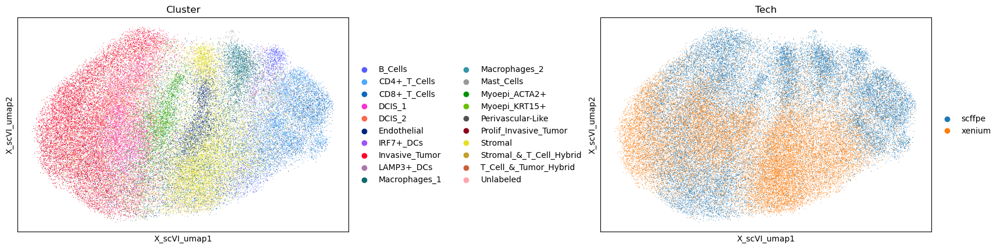

In [113]:
sc.pl.embedding(adata, basis='X_scVI_umap', color=['Cluster', 'Tech'], wspace=.6)

#### scANVI

In [118]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="Cluster",
    unlabeled_category="Unknown",
)

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scvi/data/fields/_base_field.py:64: UserWarning: adata.layers[counts] does not contain unnormalized count data. Are you sure this is what you want?
  self.validate_field(adata)


In [119]:
scanvi_model.train(max_epochs=20, n_samples_per_label=100)

INFO     Training for 20 epochs.                                                                                   


/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.10 /home/voehring/conda/spatialdata_stable/lib/pyth ...
  rank_zero_warn(
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: PossibleUserWarning: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python3.10 /home/voehring/conda/spatialdata_stable/lib/pyth ...
  rank_zero_warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|███████████████████████████████████████████████████████████████████████████████████████| 20/20 [06:38<00:00, 19.86s/it, v_num=1, train_loss_step=352, train_loss_epoch=326]

`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|███████████████████████████████████████████████████████████████████████████████████████| 20/20 [06:38<00:00, 19.95s/it, v_num=1, train_loss_step=352, train_loss_epoch=326]


In [120]:
SCANVI_LATENT_KEY = "X_scANVI"
adata.obsm[SCANVI_LATENT_KEY] = scanvi_model.get_latent_representation(adata)

In [121]:
umap(adata, basis='X_scANVI')

/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Cat

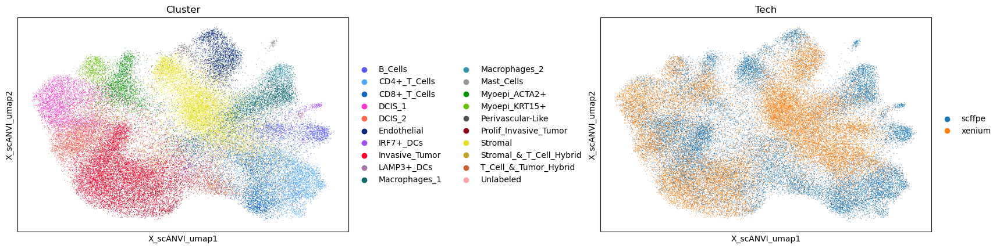

In [122]:
sc.pl.embedding(adata, basis='X_scANVI_umap', color=['Cluster', 'Tech'], wspace=.6)

### Summary

(0.0, 1.0, 0.0, 1.0)

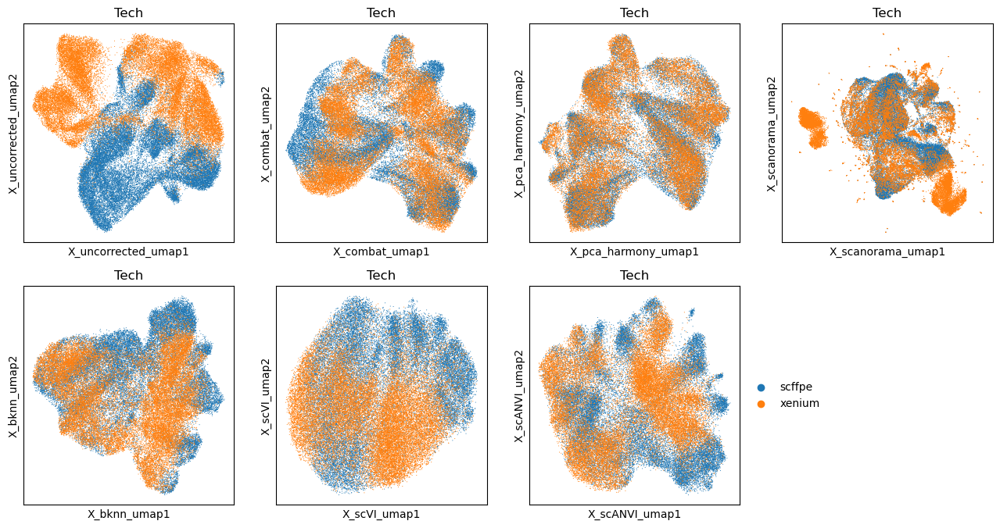

In [137]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

sc.pl.embedding(adata, basis='X_uncorrected_umap', color='Tech', ax=ax.flatten()[0], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_combat_umap', color='Tech', ax=ax.flatten()[1], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_pca_harmony_umap', color='Tech', ax=ax.flatten()[2], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scanorama_umap', color='Tech', ax=ax.flatten()[3], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_bknn_umap', color='Tech', ax=ax.flatten()[4], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scVI_umap', color='Tech', ax=ax.flatten()[5], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scANVI_umap', color='Tech', ax=ax.flatten()[6], show=False)
ax.flatten()[7].axis('off')

(0.0, 1.0, 0.0, 1.0)

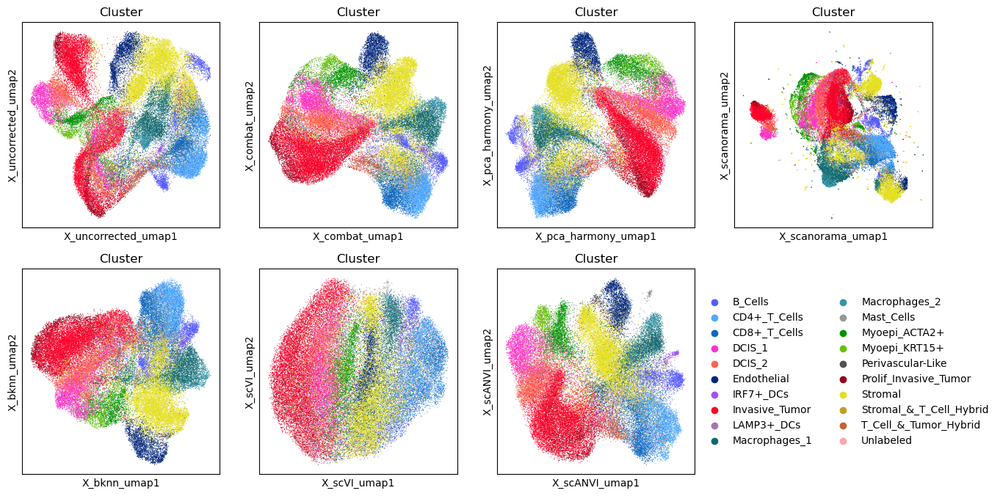

In [138]:
fig, ax = plt.subplots(2, 4, figsize=(16, 8))

sc.pl.embedding(adata, basis='X_uncorrected_umap', color='Cluster', ax=ax.flatten()[0], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_combat_umap', color='Cluster', ax=ax.flatten()[1], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_pca_harmony_umap', color='Cluster', ax=ax.flatten()[2], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scanorama_umap', color='Cluster', ax=ax.flatten()[3], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_bknn_umap', color='Cluster', ax=ax.flatten()[4], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scVI_umap', color='Cluster', ax=ax.flatten()[5], show=False, legend_loc=False)
sc.pl.embedding(adata, basis='X_scANVI_umap', color='Cluster', ax=ax.flatten()[6], show=False)
ax.flatten()[7].axis('off')

In [116]:
bm = Benchmarker(
    adata,
    batch_key="Tech",
    label_key="Cluster",
    embedding_obsm_keys=["X_uncorrected", "X_combat", "X_pca_harmony", "X_scanorama", "X_bknn_umap", "X_scVI"],
    n_jobs=-1,
)
bm.benchmark()

Metrics:  60%|██████████████████████████████████████████████████████████████████                                            | 6/10 [01:46<00:55, 13.99s/it, Batch correction: kbet_per_label]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)
/home/voehring/c

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:  70%|██████████████████████████████████████████████████████████████████████████▏                               | 7/10 [04:05<02:43, 54.61s/it, Batch correction: graph_connectivity]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:  80%|████████████████████████████████████████████████████████████████████████████████████████                      | 8/10 [04:05<01:14, 37.35s/it, Batch correction: pcr_comparison]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_pcr_comparison.py:49: UserWarning: PCR comparison score is negative, meaning variance contribution increased after integration. Setting to 0.
  warnings.warn(

Metrics:   0%|                                                                                          

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:  70%|██████████████████████████████████████████████████████████████████████████▏                               | 7/10 [03:32<02:26, 48.96s/it, Batch correction: graph_connectivity]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:   0%|                                                                                                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                             
Metrics:  60%|██████████████████████████████████████████████████████████████████                                            | 6/10 [01:17<00:28,  7.16s/it, 

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:  70%|██████████████████████████████████████████████████████████████████████████▏                               | 7/10 [03:27<02:22, 47.43s/it, Batch correction: graph_connectivity]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:   0%|                                                                                                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                             
Metrics:  60%|██████████████████████████████████████████████████████████████████                                            | 6/10 [01:17<00:29,  7.25s/it, 

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:  70%|██████████████████████████████████████████████████████████████████████████▏                               | 7/10 [03:35<02:30, 50.01s/it, Batch correction: graph_connectivity]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:   0%|                                                                                                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                             
Metrics:  60%|██████████████████████████████████████████████████████████████████                                            | 6/10 [00:56<00:22,  5.73s/it, 

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               


/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.value_counts(labs)

Metrics:  70%|██████████████████████████████████████████████████████████████████████████▏                               | 7/10 [02:53<02:06, 42.00s/it, Batch correction: graph_connectivity]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:   0%|                                                                                                                                                        | 0/10 [00:00<?, ?it/s]
                                                                                 

INFO     Unlabeled consists of a single batch or is too small. Skip.                                               



Metrics:  70%|██████████████████████████████████████████████████████████████████████████▏                               | 7/10 [03:51<02:28, 49.35s/it, Batch correction: graph_connectivity]/home/voehring/conda/spatialdata_stable/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Embeddings: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [21:35<00:00, 215.89s/it]

                                                                                                                                                                                             

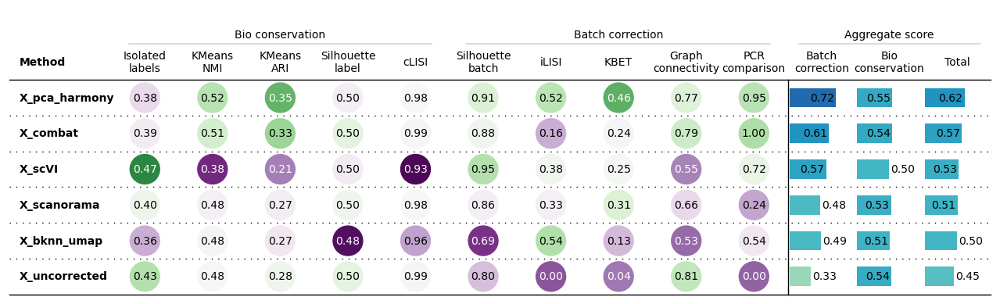

In [117]:
bm.plot_results_table(min_max_scale=False)
